# Evaluation of models for mortality prediction in terms of predictive performance, fairness, and explainability

## The following libraries need to be installed to run the notebook

In [1]:
!pip install sklearn
!pip install xgboost
!pip install lime
!pip install shap
!pip install fairlearn
!pip install aif360
!pip install PyALE

  Using cached scipy-1.5.4-cp39-cp39-win_amd64.whl (31.4 MB)
  Attempting uninstall: scipy
    Found existing installation: scipy 1.7.3
    Uninstalling scipy-1.7.3:
      Successfully uninstalled scipy-1.7.3


## Imports

In [3]:
import pandas as pd
import numpy as np
import time

from numpy import sqrt
from numpy import argmax
from collections import Counter

import matplotlib.pyplot as plt

# sklearn
from sklearn.utils import resample
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import plot_tree
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, SelectFromModel
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC

# XGBoost
from xgboost import XGBClassifier

# fairlearn
from fairlearn.metrics import selection_rate, false_positive_rate, false_negative_rate
from fairlearn.metrics import MetricFrame, demographic_parity_difference, equalized_odds_difference
from fairlearn.postprocessing import ThresholdOptimizer
from fairlearn.postprocessing import plot_threshold_optimizer

# aif360
from aif360.datasets import StandardDataset
from aif360.algorithms.postprocessing import RejectOptionClassification

# global explainers
from sklearn.inspection import plot_partial_dependence

# lime
from lime.lime_tabular import LimeTabularExplainer

# shap
from shap import Explainer

# PyALE
from PyALE import ale

# 1. Load Data

### The notebook uses a preprocessed version of the MIMIC-III dataset with default parameters. It is available [here](https://console.cloud.google.com/storage/browser/mimic_extract). To access the file, you will need to be credentialed for MIMIC-III GCP access through physionet. Instructions for that are available on [physionet](https://mimic.mit.edu/docs/gettingstarted/).

If you put the data set in the same folder as this notebook, you can use the following code to load the data set. 

In [4]:
# load data
DATA_FILEPATH     = '...' # add the name of the data file here 
patients          = pd.read_hdf(DATA_FILEPATH, 'patients')
vitals_labs_mean  = pd.read_hdf(DATA_FILEPATH, 'vitals_labs_mean')

The data file contains several tables:
* *patients*: static demographics (gender, ethnicity, age, etc.) and static outcomes (diagnosis, mortality, length-ofstay, etc.)
* *vitals_labs*: time-varying vitals and labs (including the hourly mean, count and standard deviation)
* *vitals_labs_mean*: time-varying vitals and labs (hourly mean only)
* *interventions*: hourly binary indicators for administered interventions

### Patients

The *patients* table contains demographic data, details regarding their hospital stay, outcomes, and a code status.

## Check value for each feature

In [5]:
for feature in patients.columns:
    print(feature)
    display(patients[feature].value_counts())
    print()

gender


M    19494
F    14978
Name: gender, dtype: int64


ethnicity


WHITE                                                       24429
UNKNOWN/NOT SPECIFIED                                        3221
BLACK/AFRICAN AMERICAN                                       2456
HISPANIC OR LATINO                                            881
OTHER                                                         785
UNABLE TO OBTAIN                                              652
ASIAN                                                         545
PATIENT DECLINED TO ANSWER                                    351
ASIAN - CHINESE                                               166
HISPANIC/LATINO - PUERTO RICAN                                124
BLACK/CAPE VERDEAN                                            122
WHITE - RUSSIAN                                                99
MULTI RACE ETHNICITY                                           77
BLACK/HAITIAN                                                  64
WHITE - OTHER EUROPEAN                                         59
HISPANIC/L


age


300.003078    2
300.003264    2
300.003362    2
300.003216    2
300.003257    2
             ..
84.068426     1
23.488057     1
31.126026     1
87.837211     1
63.983591     1
Name: age, Length: 34450, dtype: int64


insurance


Medicare      18317
Private       11846
Medicaid       2782
Government     1050
Self Pay        477
Name: insurance, dtype: int64


admittime


2191-08-23 07:15:00    4
2124-10-10 07:15:00    3
2105-02-09 07:15:00    3
2135-12-21 08:00:00    3
2100-12-21 07:15:00    3
                      ..
2103-08-03 13:46:00    1
2116-11-05 17:11:00    1
2150-12-03 09:22:00    1
2197-09-16 14:00:00    1
2117-12-30 07:15:00    1
Name: admittime, Length: 34279, dtype: int64


diagnosis_at_admission


PNEUMONIA                                                         825
CORONARY ARTERY DISEASE                                           751
SEPSIS                                                            612
CHEST PAIN                                                        553
CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS GRAFT /SDA         552
                                                                 ... 
RIGHT SIDED INTERCRANIAL MASS/ICH                                   1
CORONARY ARTERY DISEASE\ CORONARY ARTERY BYPASS GRAFT REDO/SDA      1
OSTEOARTHRITS, BILATERAL KNEES/SDA                                  1
TRACHEAL/BRONCHIAL ACHALSIA/SDA                                     1
SPONDYLOLISTHESIS/SDA                                               1
Name: diagnosis_at_admission, Length: 11352, dtype: int64


dischtime


2145-07-29 13:48:00    2
2117-08-31 15:00:00    2
2196-09-16 13:15:00    2
2187-10-30 16:30:00    2
2131-04-23 17:50:00    2
                      ..
2124-10-17 15:30:00    1
2113-05-01 13:20:00    1
2194-04-24 18:00:00    1
2151-05-15 13:35:00    1
2118-01-04 16:30:00    1
Name: dischtime, Length: 34362, dtype: int64


discharge_location


HOME                         10129
HOME HEALTH CARE              9229
SNF                           5203
REHAB/DISTINCT PART HOSP      3688
DEAD/EXPIRED                  3350
LONG TERM CARE HOSPITAL       1020
DISC-TRAN CANCER/CHLDRN H      451
DISCH-TRAN TO PSYCH HOSP       372
SHORT TERM HOSPITAL            353
HOSPICE-HOME                   258
LEFT AGAINST MEDICAL ADVI      186
HOSPICE-MEDICAL FACILITY       107
OTHER FACILITY                  43
HOME WITH HOME IV PROVIDR       41
ICF                             31
DISC-TRAN TO FEDERAL HC         10
SNF-MEDICAID ONLY CERTIF         1
Name: discharge_location, dtype: int64


fullcode_first


1.0    26368
0.0     1794
Name: fullcode_first, dtype: int64


dnr_first


0.0    26521
1.0     1641
Name: dnr_first, dtype: int64


fullcode


1.0    26471
0.0     1691
Name: fullcode, dtype: int64


dnr


0.0    25043
1.0     3119
Name: dnr, dtype: int64


dnr_first_charttime


2142-02-07 18:00:00    2
2108-12-16 15:00:00    2
2123-06-22 14:00:00    2
2195-05-19 15:00:00    2
2101-10-20 22:00:00    1
                      ..
2134-05-18 16:00:00    1
2123-06-22 06:00:00    1
2139-09-14 15:00:00    1
2112-12-12 17:45:00    1
2161-02-17 01:17:00    1
Name: dnr_first_charttime, Length: 3115, dtype: int64


cmo_first


0.0    28076
1.0       86
Name: cmo_first, dtype: int64


cmo_last


0.0    27246
1.0      916
Name: cmo_last, dtype: int64


cmo


0.0    27204
1.0      958
Name: cmo, dtype: int64


deathtime


2103-10-22 12:00:00    2
2177-08-16 12:00:00    2
2149-11-14 10:15:00    1
2145-09-06 20:48:00    1
2175-04-27 13:05:00    1
                      ..
2153-08-17 00:30:00    1
2101-01-07 14:30:00    1
2181-09-28 22:27:00    1
2154-09-05 20:31:00    1
2139-07-19 05:20:00    1
Name: deathtime, Length: 3348, dtype: int64


intime


2112-07-18 10:56:00    2
2141-06-25 17:41:32    1
2112-10-09 15:00:16    1
2198-08-29 03:10:03    1
2116-01-17 15:22:16    1
                      ..
2102-02-07 13:44:43    1
2105-05-31 02:36:00    1
2106-05-10 23:35:16    1
2132-09-12 07:41:04    1
2117-12-31 11:52:36    1
Name: intime, Length: 34471, dtype: int64


outtime


2101-10-26 20:43:09    1
2182-07-07 16:55:24    1
2119-03-21 17:09:46    1
2114-10-13 19:26:33    1
2114-04-20 12:41:30    1
                      ..
2102-02-09 17:11:20    1
2105-06-02 18:07:00    1
2106-05-19 15:30:58    1
2132-09-16 11:06:43    1
2118-01-01 14:51:27    1
Name: outtime, Length: 34472, dtype: int64


los_icu


0.993056    6
0.967361    5
1.052083    5
2.009028    5
1.065278    5
           ..
2.180995    1
1.969444    1
6.464769    1
6.583519    1
1.124201    1
Name: los_icu, Length: 32301, dtype: int64


admission_type


EMERGENCY    27830
ELECTIVE      5705
URGENT         937
Name: admission_type, dtype: int64


first_careunit


MICU     12207
CSRU      7050
SICU      5520
CCU       5193
TSICU     4502
Name: first_careunit, dtype: int64


mort_icu


0    32211
1     2261
Name: mort_icu, dtype: int64


mort_hosp


0    31168
1     3304
Name: mort_hosp, dtype: int64


hospital_expire_flag


0    31122
1     3350
Name: hospital_expire_flag, dtype: int64


hospstay_seq


1    34472
Name: hospstay_seq, dtype: int64


readmission_30


0    32982
1     1490
Name: readmission_30, dtype: int64


max_hours


24     901
25     873
26     841
23     830
22     799
      ... 
229     12
224     11
225     11
179      9
226      6
Name: max_hours, Length: 228, dtype: int64

#### Demographics 
* *gender* - genotypical sex of the patient (F for XX and Y for XY);
* *ethnicity* - a simplified version of the US census race/ethnicity categorization;
* *age* - age of the patient at time of admission (the age of patients older than 89 have been replaced by some value >300 for de-identification purposes)
* *insurance* - insurance type (Medicare, Private, Medicaid, Government, Self Pay)

#### Hospital Stay Details
All [dates in the dataset have been shifted](https://mimic.physionet.org/mimicdata/time/) to protect patient confidentiality.

* *admittime* - time of admission
* *diagnosis_at_admission* - the diagnosis at admission as used for [billing the patient](https://mimic.physionet.org/mimictables/diagnoses_icd/) (note that this is a proxy for the actual diagnosis)
* *dischtime* - time of discharge
* *discharge_location* - where the patient went after discharge
* *deathtime* - time of death
* *intime* - ICU admission time
* *outtime* - ICU discharge time
* *admission_type* - type of hospital admission
* *first_careunit* - the first intensive care unit the patient was admitted to: Coronary Care Unit (CCU), Cardiac and Stroke Receiving Unit (CSRU), Mobile Intensive Care Unit (MICU),  Surgical Intensive Care Unit (SICU), or Trauma Surgical Intensive Care Unit (TSICU)
* *hospstay_seq* - indicates whether this is the first, second, third etc. visit. As this dataset considers patient's  first ICU visit only, it is a constant.
* *max_hours* - number of hours (approximately) the patient stayed in the ICU


#### Outcomes
* *los_icu* - length of stay in the ICU
* *mort_icu* - indicates whether the patient died at the ICU (1 if *deathtime* between *intime* and *outtime*)
* *mort_hosp* - indicates whether the patient died at the hospital (1 if *deathtime* between *admittime* and *dischtime*)
* *hospital_expire_flag* - 1 indicates death in the hospital, and 0 indicates survival to hospital discharge
* *readmission_30* - boolean that indicates whether the patient was readmitted within 30 days after discharge

#### Code Status
At some point during their stay, patient's might be asked to select a preferred "code status", which indicates whether you would like to receive live-saving measures or not. The pre-processed data set contains info on three different code statuses. *full code* indicates that the patient would like to receive live-saving measures (such as chest compressions). *do not resuscitate* indicates do not resuscitate, but okay to intubate

* *fullcode_first* - the patient's first code status is "Full code" 
* *dnr_first* - the patient's first registered code status is "Do Not Resuscitate"
* *cmo_first* - the patient's first registered code status is "Comfort Measures Only"
* *fullcode* - the patient's chart contains at least one codestatus equal to "full code"
* *cmo* - the patient's chart contains at least one codestatus equal to "Comfort Measures Only"
* *dnr* - the patient's chart contains at least one codestatus equal to "Do Not Resuscitate"
* *dnr_first_charttime* - the charttime of the patient's first registered "Do Not Resuscitate" status
* *cmo_last* - the patient's last registered code status is "Comfort Measures Only"

## Vitals
The *vitals_labs_mean* table contains lab measurements of 104 different types of vitals, aggregated as the hourly mean for each hour of the patient's stay in the ICU.

* Lab measurements are typically infrequent and as a result the time series is **very sparse**. To obtain a denser representation that is easier to reason about and readily applied to modern machine learning methods for time-series that expect discretized time representations, **observations from each ICU stay’s time-series are aggregated into hourly buckets**.
* In the MIMIC-extract data set, vitals are grouped based on clinical domain expertise (i.e., some pre-processing has already occured for these features)


## ML Task Formulation:

### Predict whether a patient will die, given the first 24 hours of their stay

In [6]:
patients_encoded = patients.copy()
patients_encoded['age'] = patients_encoded['age'].astype(int)
patients_encoded['age'] = np.where(patients_encoded.age >=90, 90, patients_encoded.age)
patients_encoded['age_group'] = np.where(patients_encoded.age <=65, 0, 1)
patients_encoded['ethnicity'] = np.where(patients_encoded.ethnicity.str.contains("WHITE"), "WHITE",
                               np.where(patients_encoded.ethnicity.str.contains("BLACK"), 'BLACK', "OTHER"))

patients_encoded = pd.get_dummies(patients_encoded, columns=['ethnicity'])
patients_encoded.columns = patients_encoded.columns.str.replace(' ','_')

In [7]:
# SETTINGS
window_size = 24 # the first WINDOW_SIZE hours of the patient's stay
gap_time = 6  # the number of hours the patient lived at least after the first WINDOW_SIZE hours (to avoid label leakage, see MIMIC-III Extract paper)
test_size = 0.2 # proportion of the data that wil lbe used for testing
random_state = 42 # random state is used to set a seed for randomness, which is only relevant for reproducibility purposes 

# get target variable (died in ICU) of patients that stayed at least GAP_TIME + WINDOW_SIZE hours in the ICU
y = patients_encoded[patients_encoded.max_hours > window_size + gap_time]['mort_icu']

# get vitals features for patients in y and select only their first 24 hours values
X = vitals_labs_mean.copy()
X = X[(X.index.get_level_values('icustay_id').isin(set(y.index.get_level_values('icustay_id')))) & 
      (X.index.get_level_values('hours_in') < window_size)]

# change columns from tuples to string
X.columns = ['_'.join(col).strip() for col in X.columns.values]

# drop indexes 'hadm_id', 'icustay_id' from X
X = X.reset_index(level=['hadm_id', 'icustay_id'], drop=True)

# drop indexes 'hadm_id', 'icustay_id' from y
y = y.reset_index(level=['hadm_id', 'icustay_id'], drop=True)

# select demographic features
demographics = patients_encoded[['gender', 'age', 'age_group','ethnicity_BLACK','ethnicity_WHITE','ethnicity_OTHER']]

# convert gender to numeric
demographics['gender'].replace(['F', 'M'], [0, 1], inplace=True)

# get mean of each vital
X = X.groupby(['subject_id']).mean()

# merge vitals with demographics
X = pd.merge(demographics, X, on=['subject_id'])

# get number of alive and dead people
alive = y.value_counts()[0]
dead = y.value_counts()[1]
print('the number of alive patients is {} and the number of dead patients is {}'.format(alive, dead))

# merge X and y in a single df for more pre-processing
df = pd.merge(X, y, on=['subject_id'])

# replace ' ' from column names with '_'
df.columns = df.columns.str.replace(' ','_')

df


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


the number of alive patients is 22227 and the number of dead patients is 1717


,gender,age,age_group,ethnicity_BLACK,ethnicity_WHITE,ethnicity_OTHER,alanine_aminotransferase_mean,albumin_mean,albumin_ascites_mean,albumin_pleural_mean,...,total_protein_urine_mean,troponin-i_mean,troponin-t_mean,venous_pvo2_mean,weight_mean,white_blood_cell_count_mean,white_blood_cell_count_urine_mean,ph_mean,ph_urine_mean,mort_icu
subject_id,,,,,,,,,,,,,,,,,,,,,
3,1,76,1,0,1,0,25.0,1.8,NaN,NaN,...,NaN,NaN,NaN,NaN,106.000000,19.347619,35.0,7.346667,5.0,0
4,0,47,0,0,1,0,24.0,2.8,NaN,NaN,...,NaN,NaN,NaN,NaN,53.599998,9.700000,NaN,7.470000,7.0,0
6,0,65,0,0,1,0,23.0,3.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,10.600000,NaN,NaN,NaN,0
9,1,41,0,0,0,1,11.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,10.600000,NaN,7.410000,6.5,1
11,0,50,0,0,1,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,11.050000,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99973,0,65,0,0,1,0,NaN,NaN,NaN,NaN,...,NaN,NaN,0.015,NaN,104.779837,17.150000,NaN,7.210000,5.0,0
99982,1,65,0,0,1,0,19.0,3.9,NaN,NaN,...,NaN,NaN,NaN,NaN,71.710855,5.233333,NaN,7.516000,7.0,0
99991,1,47,0,0,1,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,100.324394,5.750000,1.0,7.385000,5.5,0


## The data is imbalanced as there are many alive and little dead people. This makes accuracy a bad metric for measuring the overall predictive performance of possible ML models.

## Upsampling of the minority class could be used to mitigate this issue

In [8]:
# Separate majority and minority classes
majority = df[df.mort_icu==0]
minority = df[df.mort_icu==1]
 
# Upsample minority class
minority_upsampled = resample(minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=alive,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df = pd.concat([majority, minority_upsampled])
 
# Display new class counts
print(df.mort_icu.value_counts())

# reset the index to fix the duplicate subject ids
df = df.reset_index(drop=True)
df.index.name = 'subject_id'

0    22227
1    22227
Name: mort_icu, dtype: int64


In [9]:
# get y from df
y = df['mort_icu']
# get X from df
X = df.drop('mort_icu', axis=1)

## Keep only features with 50% non-null values

In [10]:
limitPer = len(X) * 0.5
X = X.dropna(thresh=limitPer, axis=1)
X

,gender,age,age_group,ethnicity_BLACK,ethnicity_WHITE,ethnicity_OTHER,alanine_aminotransferase_mean,alkaline_phosphate_mean,anion_gap_mean,asparate_aminotransferase_mean,...,respiratory_rate_set_mean,sodium_mean,systolic_blood_pressure_mean,temperature_mean,tidal_volume_observed_mean,tidal_volume_set_mean,weight_mean,white_blood_cell_count_mean,ph_mean,ph_urine_mean
subject_id,,,,,,,,,,,,,,,,,,,,,
0,1,76,1,0,1,0,25.0,73.0,18.222222,69.0,...,17.500000,139.666667,105.652174,36.962346,664.545455,600.000000,106.000000,19.347619,7.346667,5.0
1,0,47,0,0,1,0,24.0,837.0,15.000000,64.0,...,NaN,141.000000,118.000000,36.844442,NaN,NaN,53.599998,9.700000,7.470000,7.0
2,0,65,0,0,1,0,23.0,58.0,21.500000,34.0,...,NaN,136.000000,152.188406,36.527783,NaN,NaN,NaN,10.600000,NaN,NaN
3,0,50,0,0,1,0,NaN,NaN,14.000000,NaN,...,NaN,141.500000,105.166667,36.805545,NaN,NaN,NaN,11.050000,NaN,NaN
4,1,72,1,0,1,0,NaN,NaN,19.500000,NaN,...,15.428571,143.000000,132.204545,36.831278,619.428571,628.571429,NaN,8.100000,7.233958,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44449,0,81,1,0,1,0,NaN,NaN,17.000000,NaN,...,13.142857,137.785714,124.963768,37.296522,575.500000,514.285714,63.299999,17.200000,7.327333,NaN
44450,1,77,1,0,1,0,NaN,NaN,20.600000,NaN,...,23.111111,141.909091,104.130952,NaN,576.833333,550.000000,79.860214,19.500000,7.221389,5.0
44451,0,76,1,0,1,0,52.0,55.0,15.333333,67.0,...,17.500000,141.333333,108.378472,38.031752,595.000000,600.000000,73.099998,7.450000,7.430000,NaN


## Create a train/test split, impute, and scale

In [11]:
# define train/test split based on index
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y, random_state=random_state)

# fill in missing values using the mean in the train and test split of X
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
X_train = pd.DataFrame(data=imputer.fit_transform(X_train), index=X_train.index, columns=X_train.columns)
X_test = pd.DataFrame(data=imputer.fit_transform(X_test), index=X_test.index, columns=X_test.columns)

# RobustScaler: Scale features using statistics that are robust to outliers.
# sclae values using in the train and test split of X 
feature_scaler = StandardScaler()
X_train_scaled = feature_scaler.fit_transform(X_train)
X_test_scaled = feature_scaler.transform(X_test)
X_train = pd.DataFrame(data=X_train_scaled , index= X_train.index, columns=X_train.columns)
X_test = pd.DataFrame(data=X_test_scaled , index= X_test.index, columns=X_test.columns)

In [12]:
X_train

,gender,age,age_group,ethnicity_BLACK,ethnicity_WHITE,ethnicity_OTHER,alanine_aminotransferase_mean,alkaline_phosphate_mean,anion_gap_mean,asparate_aminotransferase_mean,...,respiratory_rate_set_mean,sodium_mean,systolic_blood_pressure_mean,temperature_mean,tidal_volume_observed_mean,tidal_volume_set_mean,weight_mean,white_blood_cell_count_mean,ph_mean,ph_urine_mean
subject_id,,,,,,,,,,,,,,,,,,,,,
42358,-1.091540,1.388514,0.876949,-0.265938,0.672196,-0.569915,5.849022e-17,2.736973e-16,-0.028656,0.000000,...,0.000000,-1.535263,-0.290946,-1.496951e+00,-1.273672e-15,-1.404488e-15,-3.907239e-01,-0.484258,-2.203753,0.000000
1419,0.916137,-0.356805,-1.140317,-0.265938,0.672196,-0.569915,5.849022e-17,2.736973e-16,-0.340377,0.000000,...,-0.361322,0.172357,-0.010926,1.471760e+00,6.129059e-01,7.940735e-01,7.515477e-16,-0.125590,0.557676,3.439185
30044,-1.091540,0.515855,0.876949,-0.265938,0.672196,-0.569915,5.849022e-17,2.736973e-16,0.569848,0.000000,...,0.000000,2.040694,1.255147,1.121874e-01,-1.273672e-15,-1.404488e-15,-1.876805e+00,1.221016,-0.657915,1.137861
41367,0.916137,1.097628,0.876949,-0.265938,0.672196,-0.569915,5.849022e-17,2.736973e-16,-0.652098,0.000000,...,0.360666,-0.128988,-0.739629,7.360997e-01,-1.335165e-01,-1.059028e+00,-5.373264e-02,-0.139794,0.000000,0.000000
9751,-1.091540,0.690387,0.876949,-0.265938,0.672196,-0.569915,-3.500422e-01,-4.864357e-01,-0.028656,-0.349656,...,0.000000,0.875495,0.208087,7.027485e-02,-1.273672e-15,-1.404488e-15,6.458311e-01,-0.186670,0.000000,1.904969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24018,0.916137,-1.287642,-1.140317,-0.265938,0.672196,-0.569915,-1.854069e-01,2.736973e-16,-0.278033,-0.294981,...,0.450915,-0.110724,-0.342455,-9.527992e-15,-6.726771e-01,-2.648414e-01,9.065025e-01,0.532561,0.058792,-1.163462
42438,0.916137,0.864918,0.876949,-0.265938,-1.487662,1.754649,5.849022e-17,2.736973e-16,0.220720,0.000000,...,-0.361322,2.241591,0.693267,-1.030083e+00,9.195069e-02,7.940735e-01,7.515477e-16,-0.132692,0.466331,-1.163462
40793,0.916137,0.748564,0.876949,-0.265938,-1.487662,1.754649,5.849022e-17,2.736973e-16,0.220720,0.000000,...,0.180169,0.071909,1.347842,1.669848e+00,1.441953e+00,2.029474e+00,7.515477e-16,0.013972,1.215828,1.137861


## Model Selection: compare different machine learning models based on roc_auc_score, sensitivity, specificity

In [13]:
# True positive rate (or sensitivity)
# False positive rate (or 1 - specificity)
# (specificity = tnr)
# fnr = 1 - tpr

In [14]:
def get_selection_metrics(model, X_input, y_true_input):
    """
    Function to evaluate model based on sensitivity, specificity, tpr, fnr.
    Additionally, returns the predictions of the model.
    """
    # predict probabilities
    y_pred_prob = model.predict_proba(X_input)
    # keep probabilities for the positive outcome only
    y_pred_prob = y_pred_prob[:, 1]
    # get fpr, tpr, thresh
    fpr, tpr, thresh = roc_curve(y_true_input, y_pred_prob, pos_label=1)
    # calculate the g-mean for each threshold
    gmeans = sqrt(tpr * (1-fpr))
    # locate the index of the largest g-mean
    index = argmax(gmeans)
    # get threshold
    best_thresh = thresh[index]
    # get predictions based on this this threshold
    y_pred = [1 if i >= best_thresh else 0 for i in y_pred_prob]
    y_pred = pd.Series(y_pred, index = y_true_input.index)
    
    return tpr[index], 1 - fpr[index], y_pred, fpr, tpr 

In [15]:
# count examples in each class
counter = Counter(y_train)
# estimate scale_pos_weight value
estimate = counter[0] / counter[1]
# This estimate will be used in the XGBoost parameters grid search
estimate

0.9999437633562029

Performing model optimizations...

Estimator: Logistic Regression


The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.


Best params: {'penalty': 'l2', 'C': 0.5}
Best training roc_auc score: 0.854
Test set roc_auc score for best params: 0.772 
Sensitivity=0.759280, Specificity=0.784

Estimator: Decision Tree
Best params: {'max_depth': 15, 'criterion': 'entropy'}
Best training roc_auc score: 0.959
Test set roc_auc score for best params: 0.928 
Sensitivity=0.963105, Specificity=0.894

Estimator: Random Forest
Best params: {'max_depth': 15, 'criterion': 'entropy'}
Best training roc_auc score: 1.000
Test set roc_auc score for best params: 0.991 
Sensitivity=0.991676, Specificity=0.991

Estimator: XGBoost


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


Best params: {'scale_pos_weight': 0.9999437633562029, 'reg_lambda': 0, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0.25}
Best training roc_auc score: 0.999
Test set roc_auc score for best params: 0.994 
Sensitivity=0.997300, Specificity=0.991


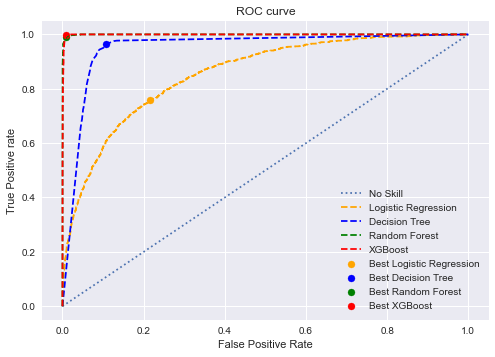

In [16]:
# ml models to be evlauated
lr_clf = LogisticRegression(class_weight='balanced', max_iter=200, random_state=42)
dt_clf = DecisionTreeClassifier(class_weight = 'balanced', random_state=42)
rf_clf = RandomForestClassifier(class_weight = 'balanced', random_state=42)
xgb_clf = XGBClassifier(objective='binary:logistic', seed=random_state, use_label_encoder =False)

# set different parameter values
param_max_depth = [3, 5, 7, 10, 15]
param_range = [0.1, 1.0, 3, 5]
param_range_fl = [1.0, 0.5, 0.1]
param_max_depth_xgb = [3, 5, 10]
param_learning_rate = [1, 0.5, 0.1, 0.01]
param_gamma = [0, 0.25, 1.0]
param_reg_lambda = [0, 1.0, 10.0]
param_scale_pos_weight = [estimate, 5, 10]

# Set grid search params for each ml algo
grid_params_lr = [{'penalty': ['l2','none'],
                   'C': param_range_fl}]

grid_params_dt = [{'criterion': ['gini', 'entropy'],
                   'max_depth': param_max_depth}]

grid_params_rf = [{'criterion': ['gini', 'entropy'],
                   'max_depth': param_max_depth}]

grid_params_xgb = [{'max_depth': param_max_depth_xgb,
                   'learning_rate': param_learning_rate,
                   'gamma': param_gamma,
                   'reg_lambda': param_reg_lambda,
                   'scale_pos_weight': param_scale_pos_weight}]

# create RandomizedSearchCV object for each ml algorithm
gs_lr = RandomizedSearchCV(estimator=lr_clf,
                           param_distributions=grid_params_lr,
                           scoring='roc_auc',
                           cv=5,
                           n_jobs=-1,
                           random_state=42)

gs_dt = RandomizedSearchCV(estimator=dt_clf,
                           param_distributions=grid_params_dt,
                           scoring='roc_auc',
                           cv=5,
                           n_jobs=-1,
                           random_state=42)

gs_rf = RandomizedSearchCV(estimator=rf_clf,
                           param_distributions=grid_params_rf,
                           scoring='roc_auc',
                           cv=5,
                           n_jobs=-1,
                           random_state=42)

gs_xgb = RandomizedSearchCV(estimator=xgb_clf,
                            param_distributions=grid_params_xgb,
                            scoring='roc_auc',
                            cv=5,
                            n_jobs=-1,
                            random_state=42)

# List of RandomizedSearchCV object for each ml algorithm for ease of iteration
grids = [gs_lr, gs_dt, gs_rf, gs_xgb]

# Dictionary of classifier types for ease of reference
grid_dict = {0: 'Logistic Regression', 1: 'Decision Tree', 2: 'Random Forest', 3:'XGBoost'}
color_dict = {0: 'orange', 1: 'blue', 2: 'green', 3: 'red'}

# set plotting
plt.style.use('seaborn')
plt.plot([0,1], [0,1], linestyle='dotted', label='No Skill')
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
    
# Fit the grid search objects
print('Performing model optimizations...')
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    
    # Fit grid search
    if grid_dict[idx] == 'XGBoost':
        gs.fit(X_train, y_train, early_stopping_rounds=10, eval_metric='auc', eval_set=[(X_test,y_test)], verbose=False)
    else:
        gs.fit(X_train, y_train)
    
    # Best parameters
    print('Best params: %s' % gs.best_params_)
    # Best training data roc_auc score
    print('Best training roc_auc score: %.3f' % gs.best_score_)

    # Predict on test data with best params
    sensitivity_gs, specificity_gs, y_pred, fpr_list, tpr_list = get_selection_metrics(gs, X_test, y_test)
    
    print('Test set roc_auc score for best params: %.3f ' % roc_auc_score(y_test, y_pred))
    print('Sensitivity=%f, Specificity=%.3f' % (sensitivity_gs, specificity_gs))
    
    # plot roc curves
    plt.plot(fpr_list, tpr_list, linestyle='--',color=color_dict[idx], label = grid_dict[idx])
    plt.scatter(1 - specificity_gs, sensitivity_gs, marker='o', color=color_dict[idx], label='Best '+grid_dict[idx])
    
plt.legend()
plt.savefig('ROC',dpi=300)
plt.show();

The results of the randomized search for hyperparameter tuning for each of the selected classifiers shows that XGBoost performs best in terms of AUC score, sensitivity, and specificity on the test set. The Random Forest classifiers sensitivity and AUC score on the test set are a bit lower. The Decision Tree classifier is the third in terms of classification performance, but its specificity is lower compared to the random forest and XGBoost. Overall, these three classifiers have similar results. The Logistic Regression classifier has much lower results compared to the other classifiers.

## Evaluate the models in terms of fairness

If a model classifies more instances of one gender or ethnicity group to the 'deceased' class, this could be because of some genetic characteristics, not because the classifier is unfair. The Equalized Odds metric is used to evaluate the models. As a result, the models should not make more mistakes for some groups than for other groups. Thus to avoid quality-of-service harm, the false positive rates (FPR) and the false negative rates (FNR) should be equal across groups. 

In [17]:
def score(y_train, y_train_pred, y_test, y_test_pred, sensitive_features_train, sensitive_features_test, 
          metric = {'roc_auc_score' : roc_auc_score, 'fpr' : false_positive_rate, 'fnr' : false_negative_rate}):
    """
    Function to evaluate classifiers.
    """
    # train set
    mf_train = MetricFrame(metric = metric, 
                           y_true = y_train,
                           y_pred = y_train_pred, 
                           sensitive_features = sensitive_features_train)
    
    
    # test set
    mf_test = MetricFrame(metric = metric, 
                          y_true = y_test,
                          y_pred = y_test_pred, 
                          sensitive_features = sensitive_features_test)
    
    mf = pd.concat([mf_train.by_group, mf_test.by_group], keys=['train', 'test']).unstack(level=0)
    return mf

In [18]:
def label_race (row):
    if row['ethnicity_WHITE'] == 1 :
        return 'WHITE'
    if row['ethnicity_BLACK'] == 1 :
        return 'BLACK'
    return 'OTHER'

def label_age (row):
    if row['age_group'] > 0 :
        return '>65'
    return '<=65'

def label_gender (row):
    if row['gender'] > 0  :
        return 'M'
    return 'F'

def label_race_numeric (row):
    if row['ethnicity_WHITE'] == 1 :
        return 0
    if row['ethnicity_BLACK'] == 1 :
        return 1
    return 2

In [19]:
def get_score_prediction_threshold(model, X_input, y_true):
    # predict probabilities for X_input
    y_score = model.predict_proba(X_input)
    # keep probabilities for the positive outcome only
    y_hat = y_score[:, 1]
    # calculate tpr, fpr, thresholds for X_input
    fpr, tpr, thresh = roc_curve(y_true, y_hat, pos_label=1)
    # calculate the g-mean of test set for each threshold
    gmeans = sqrt(tpr * (1-fpr))
    # locate the index of the largest g-mean of test set
    index = argmax(gmeans)
    # get testing threshold
    best_thresh = thresh[index]
    # get predictions based on this this threshold
    y_pred = [1 if i >= best_thresh else 0 for i in y_hat]
    y_pred = pd.Series(y_pred, index = y_true.index)
    
    return y_score, y_pred, best_thresh

## Use equalized odds as a fairness metric

Separate tests for the sensitive features 'age group', 'gender', and 'ethnicity' for each of the models are performed.

## Linear regression model - ethnicity 

In [20]:
y_train_score_lr, y_train_pred_lr, training_thresh_lr = get_score_prediction_threshold(gs_lr, X_train, y_train)
y_test_score_lr, y_test_pred_lr, testing_thresh_lr = get_score_prediction_threshold(gs_lr, X_test, y_test)

X_test['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)
X_train['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)

# get table of all fainress metric values and display it
fairness_table_lr = score(y_train, y_train_pred_lr, y_test, y_test_pred_lr, X_train['ethnicity'], X_test['ethnicity'])
display(fairness_table_lr)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_lr, 
                                                                sensitive_features=X_test['ethnicity']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_lr))

X_train = X_train.drop('ethnicity', axis=1)
X_test = X_test.drop('ethnicity', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                  train      test     train      test     train      test
ethnicity                                                                
BLACK          0.748371   0.74077  0.158996  0.125767  0.344262  0.392694
OTHER           0.77117  0.774333   0.31807  0.283784   0.13959  0.167551
WHITE          0.771253  0.766327  0.237402  0.204877  0.220093   0.26247

equalized odds (test): 0.23
roc_auc (test): 0.77


## Linear regression model - gender 

In [21]:
X_test['gender_'] = df.apply(lambda row: label_gender(row), axis=1)
X_train['gender_'] = df.apply(lambda row: label_gender(row), axis=1)

# get table of all fainress metric values and display it
fairness_table_lr = score(y_train, y_train_pred_lr, y_test, y_test_pred_lr, X_train['gender_'], X_test['gender_'])
display(fairness_table_lr)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_lr, 
                                                                sensitive_features=X_test['gender_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_lr))

X_train = X_train.drop('gender_', axis=1)
X_test = X_test.drop('gender_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                train      test     train      test     train      test
gender_                                                                
F            0.763236  0.756813  0.285274  0.257482  0.188255  0.228893
M            0.782174  0.782084  0.218322  0.184211  0.217331  0.251621

equalized odds (test): 0.07
roc_auc (test): 0.77


## Linear regression model - age group 

In [22]:
X_test['age_group_'] = df.apply(lambda row: label_age(row), axis=1)
X_train['age_group_'] = df.apply(lambda row: label_age(row), axis=1)

# get table of all fainress metric values and display it
fairness_table_lr = score(y_train, y_train_pred_lr, y_test, y_test_pred_lr, X_train['age_group_'], X_test['age_group_'])
display(fairness_table_lr)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_lr, 
                                                                sensitive_features=X_test['age_group_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_lr))

X_train = X_train.drop('age_group_', axis=1)
X_test = X_test.drop('age_group_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                   train      test     train      test     train      test
age_group_                                                                
<=65            0.806628  0.794297  0.152193  0.125341  0.234551  0.286065
>65              0.73581  0.740126  0.343044  0.305258  0.185337  0.214489

equalized odds (test): 0.18
roc_auc (test): 0.77


In [23]:
sensitive_attr = set(X_train['age_group'].tolist())
sensitive_attr

{-1.1403172432552273, 0.8769489419850675}

### For LogisticRegression, the results are not  good for ethnicity and age group features, so they could be optimized using AIF360’s RejectOptionClassification function

## Post-Processing using AIF360's RejectOptionClassification

In [24]:
# create training data object
X_test['ethnicity'] = df.apply(lambda row: label_race_numeric(row), axis=1)
X_train['ethnicity'] = df.apply(lambda row: label_race_numeric(row), axis=1)


optimize_for=['ethnicity', 'age_group']
df_train = X_train.copy()
df_train['mortality'] = y_train
dataset_train = StandardDataset(df = df_train, label_name='mortality', favorable_classes=[1],
                                protected_attribute_names = optimize_for, privileged_classes = [[2],[0.8769489419850675]])

# create test dataset object
df_test = X_test.copy()
df_test['mortality'] = y_test
dataset_test = StandardDataset(df = df_test, label_name='mortality', favorable_classes=[1], 
                                protected_attribute_names = optimize_for, privileged_classes = [[2],[0.8769489419850675]])

# create training data prediction
dataset_train_pred = dataset_train.copy(deepcopy=True)
dataset_train_pred.scores = y_train_score_lr[:,1].reshape(-1,1)

# create test data prediction
dataset_test_pred = dataset_test.copy(deepcopy=True)
dataset_test_pred.scores = y_test_score_lr[:,1].reshape(-1,1)


# train reject option classifier
rc = RejectOptionClassification(unprivileged_groups=[{'ethnicity' : 0, 'ethnicity' : 1,'age_group' : -1.1403172432552273} ], 
                                privileged_groups=[{'ethnicity' : 2,'age_group' : 0.8769489419850675}],
                                metric_name='Average odds difference')
rc.fit(dataset_true=dataset_train, dataset_pred=dataset_train_pred)

# print results
print("Classification Threshold: %.2f" % rc.classification_threshold)
print("Margin: %.2f" % rc.ROC_margin)


# evaluate classifier
y_train_pred_rc = rc.predict(dataset_train_pred).labels 
y_test_pred_rc = rc.predict(dataset_test_pred).labels

X_train = X_train.drop('ethnicity', axis=1)
X_test = X_test.drop('ethnicity', axis=1)

X_test['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)
X_train['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)
X_test['age_group_'] = df.apply(lambda row: label_age(row), axis=1)
X_train['age_group_'] = df.apply(lambda row: label_age(row), axis=1)

display(score(y_train, y_train_pred_rc, y_test, y_test_pred_rc, X_train['ethnicity'], X_test['ethnicity']))
print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_rc, sensitive_features=X_test['ethnicity']))


display(score(y_train, y_train_pred_rc, y_test, y_test_pred_rc, X_train['age_group_'], X_test['age_group_']))
print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_rc, sensitive_features=X_test['age_group_']))

print('auc_score (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_rc))

X_train = X_train.drop('ethnicity', axis=1)
X_test = X_test.drop('ethnicity', axis=1)
X_train = X_train.drop('age_group_', axis=1)
X_test = X_test.drop('age_group_', axis=1)

Classification Threshold: 0.46
Margin: 0.16


The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                  train      test     train      test     train      test
ethnicity                                                                
BLACK          0.750558  0.766318  0.232218  0.211656  0.266667  0.255708
OTHER          0.784449  0.785126  0.238278  0.243243  0.192823  0.186505
WHITE          0.770208  0.768415      0.24  0.241292  0.219585  0.221878

equalized odds (test): 0.07


The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                   train      test     train      test     train      test
age_group_                                                                
<=65              0.8064  0.804904  0.165129  0.161217   0.22207  0.228975
>65             0.738617  0.739883  0.312901  0.316399  0.209864  0.203835

equalized odds (test): 0.16
auc_score (test): 0.77


## Decision Tree model - ethnicity

In [25]:
y_train_score_dt, y_train_pred_dt, training_thresh_dt = get_score_prediction_threshold(gs_dt, X_train, y_train)
y_test_score_dt, y_test_pred_dt, testing_thresh_dt = get_score_prediction_threshold(gs_dt, X_test, y_test)

X_test['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)
X_train['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)

# get table of all fainress metric values and display it
fairness_table_dt = score(y_train, y_train_pred_dt, y_test, y_test_pred_dt, X_train['ethnicity'], X_test['ethnicity'])
display(fairness_table_dt)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_dt, 
                                                                sensitive_features=X_test['ethnicity']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_dt))

X_train = X_train.drop('ethnicity', axis=1)
X_test = X_test.drop('ethnicity', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                  train      test     train      test     train      test
ethnicity                                                                
BLACK          0.976217  0.935793  0.027894   0.07362  0.019672  0.054795
OTHER          0.970826  0.938341  0.049081  0.091476  0.009267  0.031842
WHITE           0.96499  0.924082  0.052047  0.113996  0.017974   0.03784

equalized odds (test): 0.04
roc_auc (test): 0.93


## Decision Tree model - gender

In [26]:
X_test['gender_'] = df.apply(lambda row: label_gender(row), axis=1)
X_train['gender_'] = df.apply(lambda row: label_gender(row), axis=1)

# get table of all fainress metric values
fairness_table_dt = score(y_train, y_train_pred_dt, y_test, y_test_pred_dt, X_train['gender_'], X_test['gender_'])
# display it
display(fairness_table_dt)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_dt, 
                                                                sensitive_features=X_test['gender_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_dt))

X_train = X_train.drop('gender_', axis=1)
X_test = X_test.drop('gender_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                train      test     train      test     train      test
gender_                                                                
F            0.961871  0.923001  0.058854  0.115067  0.017405  0.038931
M            0.971936  0.932849  0.042204  0.099282  0.013925  0.035019

equalized odds (test): 0.02
roc_auc (test): 0.93


## Decision Tree model - age group

In [27]:
X_test['age_group_'] = df.apply(lambda row: label_age(row), axis=1)
X_train['age_group_'] = df.apply(lambda row: label_age(row), axis=1)

# get table of all fainress metric values
fairness_table_dt = score(y_train, y_train_pred_dt, y_test, y_test_pred_dt, X_train['age_group_'], X_test['age_group_'])
# display it
display(fairness_table_dt)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_dt, 
                                                                sensitive_features=X_test['age_group_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_dt))

X_train = X_train.drop('age_group_', axis=1)
X_test = X_test.drop('age_group_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score                 fpr                 fnr          
                   train      test     train      test     train      test
age_group_                                                                
<=65            0.982862   0.93784  0.028796  0.088102  0.005479  0.036219
>65             0.954161  0.919414  0.070183  0.123886  0.021495  0.037287

equalized odds (test): 0.04
roc_auc (test): 0.93


## Random Forest model - ethnicity

In [28]:
y_train_score_rf, y_train_pred_rf, training_thresh_rf = get_score_prediction_threshold(gs_rf, X_train, y_train)
y_test_score_rf, y_test_pred_rf, testing_thresh_rf = get_score_prediction_threshold(gs_rf, X_test, y_test)

X_test['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)
X_train['ethnicity'] = df.apply(lambda row: label_race(row), axis=1)

# get table of all fainress metric values
fairness_table_rf = score(y_train, y_train_pred_rf, y_test, y_test_pred_rf, X_train['ethnicity'], X_test['ethnicity'])
# display it
display(fairness_table_rf)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_rf, 
                                                                sensitive_features=X_test['ethnicity']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_rf))

X_train = X_train.drop('ethnicity', axis=1)
X_test = X_test.drop('ethnicity', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score             fpr             fnr          
                  train      test train      test train      test
ethnicity                                                        
BLACK               1.0  0.990083   0.0  0.006135   0.0  0.013699
OTHER               1.0  0.993806   0.0  0.009356   0.0  0.003033
WHITE               1.0  0.989932   0.0  0.009816   0.0   0.01032

equalized odds (test): 0.01
roc_auc (test): 0.99


## Random Forest model - gender

In [29]:
X_test['gender_'] = df.apply (lambda row: label_gender(row), axis=1)
X_train['gender_'] = df.apply (lambda row: label_gender(row), axis=1)

# get table of all fainress metric values
fairness_table_rf = score(y_train, y_train_pred_rf, y_test, y_test_pred_rf, X_train['gender_'], X_test['gender_'])
# display it
display(fairness_table_rf)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_rf, 
                                                                sensitive_features=X_test['gender_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_rf))

X_train = X_train.drop('gender_', axis=1)
X_test = X_test.drop('gender_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score             fpr             fnr          
                train      test train      test train      test
gender_                                                        
F                 1.0   0.99294   0.0  0.010836   0.0  0.003283
M                 1.0  0.989328   0.0  0.008373   0.0   0.01297

equalized odds (test): 0.01
roc_auc (test): 0.99


## Random Forest model - ethnicity

In [30]:
X_test['age_group_'] = df.apply (lambda row: label_age(row), axis=1)
X_train['age_group_'] = df.apply (lambda row: label_age(row), axis=1)

# get table of all fainress metric values
fairness_table_rf = score(y_train, y_train_pred_rf, y_test, y_test_pred_rf, X_train['age_group_'], X_test['age_group_'])
# display it
display(fairness_table_rf)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_rf, 
                                                                sensitive_features=X_test['age_group_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_rf))

X_train = X_train.drop('age_group_', axis=1)
X_test = X_test.drop('age_group_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score             fpr             fnr          
                   train      test train      test train      test
age_group_                                                        
<=65                 1.0  0.993525   0.0  0.006812   0.0  0.006139
>65                  1.0   0.98919   0.0  0.012032   0.0  0.009588

equalized odds (test): 0.01
roc_auc (test): 0.99


## XGBoost model - ethnicity

In [31]:
y_train_score_xgb, y_train_pred_xgb, training_thresh_xgb = get_score_prediction_threshold(gs_xgb, X_train, y_train)
y_test_score_xgb, y_test_pred_xgb, testing_thresh_xgb = get_score_prediction_threshold(gs_xgb, X_test, y_test)

X_test['ethnicity'] = df.apply (lambda row: label_race(row), axis=1)
X_train['ethnicity'] = df.apply (lambda row: label_race(row), axis=1)

# get table of all fainress metric values
fairness_table_xgb = score(y_train, y_train_pred_xgb, y_test, y_test_pred_xgb, X_train['ethnicity'], X_test['ethnicity'])
# display it
display(fairness_table_xgb)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_xgb, 
                                                                sensitive_features=X_test['ethnicity']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_xgb))

X_train = X_train.drop('ethnicity', axis=1)
X_test = X_test.drop('ethnicity', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score             fpr             fnr          
                  train      test train      test train      test
ethnicity                                                        
BLACK               1.0  0.996933   0.0  0.006135   0.0       0.0
OTHER               1.0  0.992247   0.0  0.012474   0.0  0.003033
WHITE               1.0  0.994507   0.0  0.008233   0.0  0.002752

equalized odds (test): 0.01
roc_auc (test): 0.99


## XGBoost model - gender

In [32]:
X_test['gender_'] = df.apply (lambda row: label_gender(row), axis=1)
X_train['gender_'] = df.apply (lambda row: label_gender(row), axis=1)

# get table of all fainress metric values
fairness_table_xgb = score(y_train, y_train_pred_xgb, y_test, y_test_pred_xgb, X_train['gender_'], X_test['gender_'])
# display it
display(fairness_table_xgb)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_xgb, 
                                                                sensitive_features=X_test['gender_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_xgb))

X_train = X_train.drop('gender_', axis=1)
X_test = X_test.drop('gender_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score             fpr             fnr          
                train      test train      test train      test
gender_                                                        
F                 1.0  0.993597   0.0  0.011868   0.0  0.000938
M                 1.0  0.994449   0.0  0.006778   0.0  0.004323

equalized odds (test): 0.01
roc_auc (test): 0.99


## XGBoost model - age group

In [33]:
X_test['age_group_'] = df.apply (lambda row: label_age(row), axis=1)
X_train['age_group_'] = df.apply (lambda row: label_age(row), axis=1)

# get table of all fainress metric values
fairness_table_xgb = score(y_train, y_train_pred_xgb, y_test, y_test_pred_xgb, X_train['age_group_'], X_test['age_group_'])
# display it
display(fairness_table_xgb)

print('equalized odds (test): %.2f' % equalized_odds_difference(y_true=y_test, y_pred=y_test_pred_xgb, 
                                                                sensitive_features=X_test['age_group_']))

print('roc_auc (test): %.2f' % roc_auc_score(y_true=y_test, y_score=y_test_pred_xgb))

X_train = X_train.drop('age_group_', axis=1)
X_test = X_test.drop('age_group_', axis=1)

The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error
The positional argument 'metric' has been replaced by a keyword argument 'metrics'. From version 0.10.0 passing it as a positional argument or as a keyword argument 'metric' will result in an error


roc_auc_score             fpr             fnr          
                   train      test train      test train      test
age_group_                                                        
<=65                 1.0  0.994752   0.0  0.006812   0.0  0.003683
>65                  1.0  0.993364   0.0  0.011141   0.0  0.002131

equalized odds (test): 0.00
roc_auc (test): 0.99


It can be concluded that from all the models XGBoost performs best in terms of fairness. The XGBoost model performed better than Random Forest model in terms of predictive performance and fairness. Furthermore, these models are similar in terms of complexity. That is why XGBoost will be compared with the Decision Tree in terms of explainability. Moreover, the Decision Tree classifier performed better than the Logistic Regression classifier and decision trees are generally more interpretable than random forests.

## POST-HOC EXPLANATIONS

Approximate the complex decision tree with a simpler one. Fit the decision tree classifier of depth 4 to the predictions of the more complex decision tree classifier. Then compute the fidelity, which indicates how the decision tree predicts the predictions of the complex classifier, and the predictive performance. Additionally, the decision trees were plotted and the most important features for the complex DT classifier and its surrogate model were compared

## Decision Tree

In [34]:
model_dt = DecisionTreeClassifier(max_depth=15, criterion='entropy', class_weight = 'balanced', random_state=42)
model_dt.fit(X_train, y_train)
_, y_train_pred_dt, _ = get_score_prediction_threshold(model_dt, X_train, y_train)
_, y_test_pred_dt, _ = get_score_prediction_threshold(model_dt, X_test, y_test)
sensitivity_dt, specificity_dt, _, _, _ = get_selection_metrics(model_dt, X_test, y_test)
print('Test set roc_auc score for best params: %.3f ' % roc_auc_score(y_test, y_test_pred_dt))
print('Sensitivity=%f, Specificity=%.3f' % (sensitivity_dt, specificity_dt))

Test set roc_auc score for best params: 0.928 
Sensitivity=0.963105, Specificity=0.894


### List feature importances

In [35]:
pd.Series(model_dt.feature_importances_, list(X_train)).sort_values(ascending=False).head(10)

respiratory_rate_set_mean                         0.090049
glascow_coma_scale_total_mean                     0.079668
blood_urea_nitrogen_mean                          0.060810
respiratory_rate_mean                             0.042014
anion_gap_mean                                    0.039349
tidal_volume_observed_mean                        0.037109
glucose_mean                                      0.030262
oxygen_saturation_mean                            0.029048
systolic_blood_pressure_mean                      0.027970
mean_corpuscular_hemoglobin_concentration_mean    0.025510
dtype: float64

### Obtain the 4 most important features

In [36]:
features = X_train.columns
importances = model_dt.feature_importances_
sorted_idx = np.argsort(importances)[::-1]

sel_features = []
for i in range(4):
    idx = sorted_idx[i]
    sel_features.append(features[idx])

print(sel_features)

['respiratory_rate_set_mean', 'glascow_coma_scale_total_mean', 'blood_urea_nitrogen_mean', 'respiratory_rate_mean']


### Global surrogate model

In [37]:
dt = DecisionTreeClassifier(max_depth=4)
dt.fit(X_train, y_train_pred_dt)

# compute fidelity
print("\n Fidelity")
print(' tpr (train) : %.2f \n tnr (train) : %.2f' % get_selection_metrics(dt, X_train, y_train_pred_dt)[:2])
print(' tpr (test)  : %.2f \n tnr (test)  : %.2f' % get_selection_metrics(dt, X_test, y_test_pred_dt)[:2])

# compute predictive performance
print("\n Predictive Performance")
print(' tpr (train) : %.2f \n tnr (train) : %.2f' % get_selection_metrics(dt, X_train, y_train)[:2])
print(' tpr (test)  : %.2f \n tnr (test)  : %.2f' % get_selection_metrics(dt, X_test, y_test)[:2])


 Fidelity
 tpr (train) : 0.64 
 tnr (train) : 0.82
 tpr (test)  : 0.64 
 tnr (test)  : 0.82

 Predictive Performance
 tpr (train) : 0.64 
 tnr (train) : 0.80
 tpr (test)  : 0.65 
 tnr (test)  : 0.80


In [38]:
pd.Series(dt.feature_importances_, list(X_train)).sort_values(ascending=False).head(10)

anion_gap_mean                   0.334600
glascow_coma_scale_total_mean    0.195114
tidal_volume_observed_mean       0.192895
respiratory_rate_set_mean        0.095563
prothrombin_time_pt_mean         0.060809
respiratory_rate_mean            0.053875
alanine_aminotransferase_mean    0.021922
potassium_mean                   0.020067
glucose_mean                     0.008792
lactic_acid_mean                 0.007133
dtype: float64

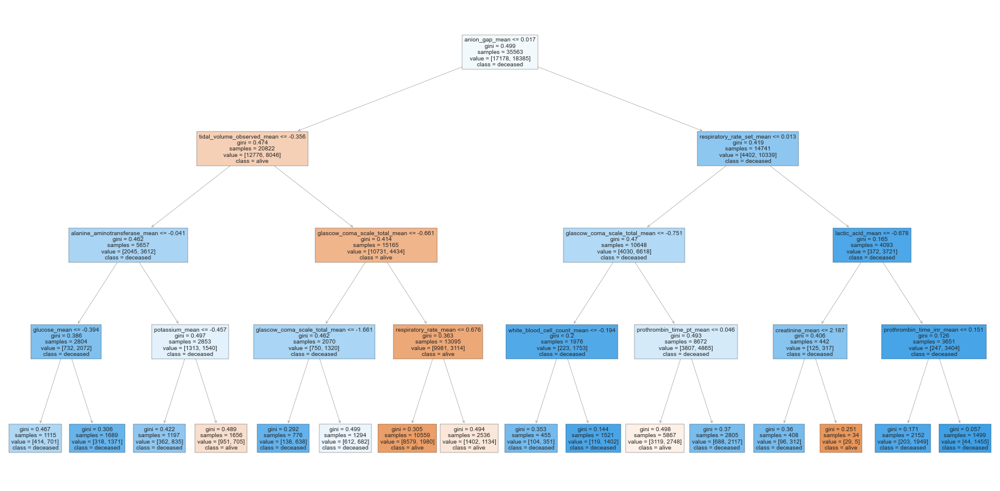

In [39]:
fig = plt.figure(figsize=(30,15)) 
fig = plot_tree(dt, fontsize=10, feature_names = list(X_train), class_names=['alive', 'deceased'], filled=True)
plt.show()

### PyALE

Investigate the model’s behavior on the 4 most important features using an accumulated local effects (ALE) plot.

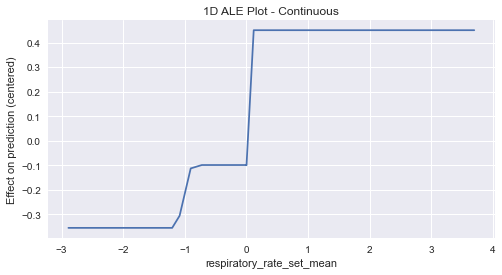

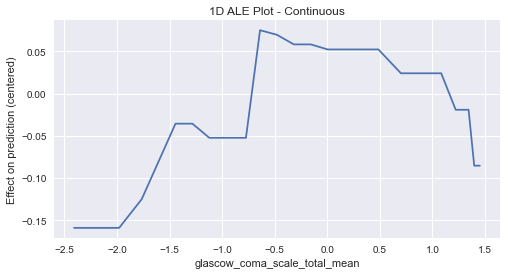

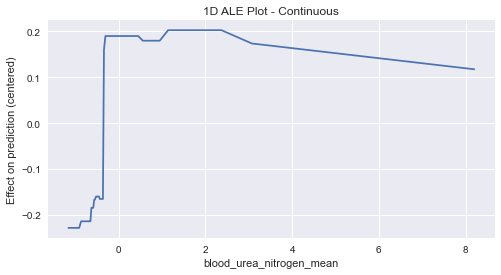

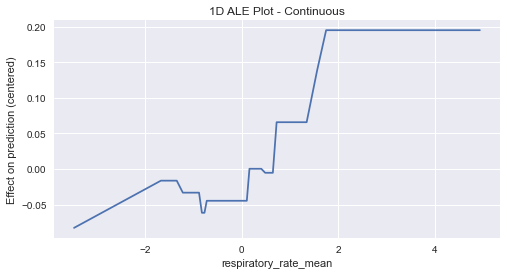

In [40]:
## 1D - continuous - no CI
for f in sel_features:
    ale_eff = ale(
        X=X_test, model=model_dt, feature=[f], grid_size=50, include_CI=False, feature_type="continuous"
    )

### LIME

Randomly select 3 instances and explore them in more detail using local explanations.

In [41]:
# sample three instances
sample_X = X_test.sample(n=3, random_state=45)
sample_y = y[sample_X.index]

# display instance, true class, and model confidence
display(sample_X)
print("Decision Tree:")
print("True values")
print(list(sample_y))
print("Predictions")
print([i[1] for i in model_dt.predict_proba(sample_X)])
sample_y

,gender,age,age_group,ethnicity_BLACK,ethnicity_WHITE,ethnicity_OTHER,alanine_aminotransferase_mean,alkaline_phosphate_mean,anion_gap_mean,asparate_aminotransferase_mean,...,respiratory_rate_set_mean,sodium_mean,systolic_blood_pressure_mean,temperature_mean,tidal_volume_observed_mean,tidal_volume_set_mean,weight_mean,white_blood_cell_count_mean,ph_mean,ph_urine_mean
subject_id,,,,,,,,,,,,,,,,,,,,,
15151,0.916137,-0.531337,-1.140317,-0.265938,0.672196,-0.569915,7.610076,-0.480016,0.497805,5.140696,...,0.002951,-0.530781,-0.397645,-0.462504,0.011383,-0.009146,3.387646,0.105237,0.012394,-1.163462
23262,0.916137,0.341323,0.876949,-0.265938,0.672196,-0.569915,-0.331521,-0.823481,1.031194,-0.322926,...,0.761771,0.423478,-0.497023,0.087349,0.479586,0.176373,0.042918,-0.014319,-1.313725,-1.163462
37090,0.916137,0.457677,0.876949,-0.265938,0.672196,-0.569915,-0.341810,-0.447916,0.054469,-0.347226,...,-0.902813,-0.218275,0.757477,0.144117,2.657515,2.492750,0.042918,-0.400806,0.663074,-0.002437


Decision Tree:
True values
[0, 1, 1]
Predictions
[0.0, 1.0, 0.6538334252619965]


subject_id
15151    0
23262    1
37090    1
Name: mort_icu, dtype: int64

The first instance is a person who is alive and the other two instances are people who died. The DT predicts the first two instances with high confidence.

LIME trains a local surrogate model for each instance and the implementation of the lime library uses a lasso regression model. To control the training of the surrogate model 5000 samples are created using perturbation, as well as the euclidean distance metric to compute the distance between them. The number of features in the surrogate model is set to 10. They are selected using forward selection since the actual number of features is much higher. The function also takes the sample of 3 instances as well as the predictions of the classifier. The local statistics of the local surrogate model that was trained are printed. These statistics are the local prediction, the fit (R2), and the intercept. Additionally, for each model, it explains the predictions for each instance. These explanations are in the form of the coefficients that were learned for each feature of an instance. Since a local lasso regression model is used and some vital features are correlated, feature importance may be arbitrarily attributed to these correlated features.

In [42]:
# local explainers
# define lime explainer
lime_explainer = LimeTabularExplainer(np.array(X_train), mode='classification', feature_names=list(X_train), 
                                     kernel_width = np.sqrt(len(X_train)), discretize_continuous=False, 
                                     feature_selection='forward_selection')

# explain the three instances
for i in range(3):
    explanation_i = lime_explainer.explain_instance(sample_X.iloc[i], model_dt.predict_proba, num_features=10, 
                                                    num_samples=5000, distance_metric="euclidean", )
    print("Local prediction: %.2f" % explanation_i.local_pred)
    print("Fit (Rˆ2): %.2f" % explanation_i.score)
    print("Intercept: %.2f" % explanation_i.intercept[1])
    explanation_i.show_in_notebook()
    
    plt.show()

Local prediction: 0.29
Fit (Rˆ2): 0.06
Intercept: 0.22


Local prediction: 0.43
Fit (Rˆ2): 0.06
Intercept: 0.23


Local prediction: 0.09
Fit (Rˆ2): 0.06
Intercept: 0.23


### SHAP

Visualize the SHAP values for each of the three instances. SHAP values are the average of marginal contributions. They should be interpreted as to what extent the fact that the instance had a specific feature value contributed to the model’s prediction, compared to the model’s output averaged over the data set. It is important to keep in mind that SHAP may have out-of-distribution problems. The SHAP values may also depend on which features are included in the analysis similar to LIME.

Base value: 0.58


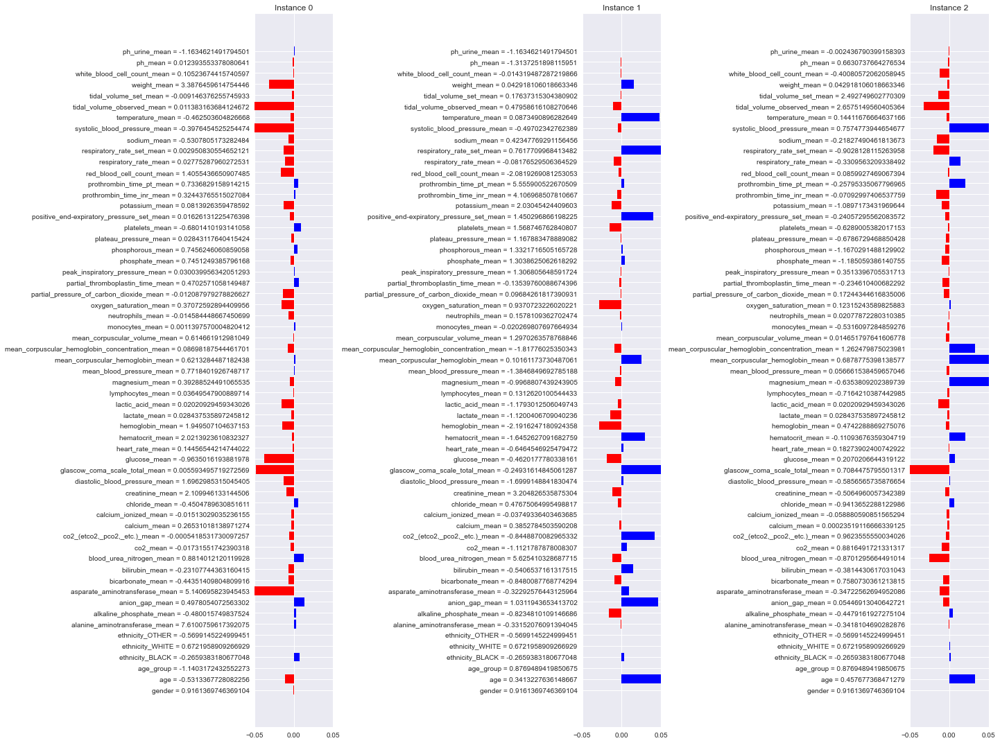

In [43]:
explainer = Explainer(model_dt, X_train)
shap_values = explainer(sample_X)

# compute base value to compare against
print("Base value: %.2f" %shap_values.base_values[0][1])

# plot shap values
feature_names = list(X_train)
fig, ax = fig, ax = plt.subplots(1,3, figsize=(20,15))
for i in range(3):
    # get values for instance
    feature_values_i = shap_values.data[i]
    shap_values_i = [i[1] for i in shap_values[i].values]
    feature_labels_i = ['%s = %s' % (name, value) for name, value in zip(feature_names, feature_values_i)]
    # plot instance
    ax[i].barh(feature_labels_i, shap_values_i, color=['b' if i>= 0 else 'r' for i in np.sign(shap_values_i)])
    ax[i].set_title("Instance %s" % i)
    ax[i].set_xlim(-0.05,0.05) # all features
    #ax[i].set_xlim(-0.00005,0.00005) # only best features
plt.tight_layout()
plt.show()

In [44]:
print("Instance 1")
print("average prediction:  %.2f" % shap_values.base_values[1][1])
print("sum(SHAP values):    %.2f" % np.sum([i[1] for i in shap_values.values[1]]))
print("model prediction:    %.2f" % model_dt.predict_proba([sample_X.iloc[1]])[0][1])

Instance 1
average prediction:  0.58
sum(SHAP values):    0.42
model prediction:    1.00


## XGBoost

In [45]:
model = XGBClassifier(objective='binary:logistic', seed=random_state, scale_pos_weight=estimate,
                      reg_lambda=0, max_depth=10, learning_rate=0.1, gamma=0.25, use_label_encoder=False)

model.fit(X_train, y_train, early_stopping_rounds=10, eval_metric='auc', eval_set=[(X_test,y_test)], verbose=False)

_, y_train_pred_xgb, _ = get_score_prediction_threshold(model, X_train, y_train)
_, y_test_pred_xgb, _ = get_score_prediction_threshold(model, X_test, y_test)

# Predict on test data with best params
sensitivity_xgb, specificity_xgb, _, _, _ = get_selection_metrics(model, X_test, y_test)

print('Test set roc_auc score for best params: %.3f ' % roc_auc_score(y_test, y_test_pred_xgb))
print('Sensitivity=%f, Specificity=%.3f' % (sensitivity_xgb, specificity_xgb))

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


Test set roc_auc score for best params: 0.994 
Sensitivity=0.997300, Specificity=0.991


### List feature importances

In [46]:
pd.Series(model.feature_importances_, list(X_train)).sort_values(ascending=False).head(10)

respiratory_rate_set_mean                    0.084949
glascow_coma_scale_total_mean                0.053253
tidal_volume_observed_mean                   0.042296
blood_urea_nitrogen_mean                     0.039205
anion_gap_mean                               0.036266
respiratory_rate_mean                        0.024835
ethnicity_BLACK                              0.020576
positive_end-expiratory_pressure_set_mean    0.020378
glucose_mean                                 0.019955
lactic_acid_mean                             0.019869
dtype: float32

### Obtain the 4 most important features

In [47]:
features = X_train.columns
importances = model.feature_importances_
sorted_idx = np.argsort(importances)[::-1]

sel_features = []
for i in range(4):
    idx = sorted_idx[i]
    sel_features.append(features[idx])

print(sel_features)

['respiratory_rate_set_mean', 'glascow_coma_scale_total_mean', 'tidal_volume_observed_mean', 'blood_urea_nitrogen_mean']


### Global Surrogate Model

In [48]:
dt = DecisionTreeClassifier(max_depth=4)
dt.fit(X_train, y_train_pred_xgb)

# compute fidelity for XGB
print("\n Fidelity")
print(' tpr (train) : %.2f \n tnr (train) : %.2f' % get_selection_metrics(dt, X_train, y_train_pred_xgb)[:2])
print(' tpr (test)  : %.2f \n tnr (test)  : %.2f' % get_selection_metrics(dt, X_test, y_test_pred_xgb)[:2])

# compute predictive performance
print("\n Predictive Performance")
print(' tpr (train) : %.2f \n tnr (train) : %.2f' % get_selection_metrics(dt, X_train, y_train)[:2])
print(' tpr (test)  : %.2f \n tnr (test)  : %.2f' % get_selection_metrics(dt, X_test, y_test)[:2])


 Fidelity
 tpr (train) : 0.68 
 tnr (train) : 0.74
 tpr (test)  : 0.69 
 tnr (test)  : 0.75

 Predictive Performance
 tpr (train) : 0.68 
 tnr (train) : 0.74
 tpr (test)  : 0.69 
 tnr (test)  : 0.74


In [49]:
pd.Series(dt.feature_importances_, list(X_train)).sort_values(ascending=False).head(10)

respiratory_rate_set_mean                    0.340943
glascow_coma_scale_total_mean                0.257324
blood_urea_nitrogen_mean                     0.189104
tidal_volume_observed_mean                   0.063725
systolic_blood_pressure_mean                 0.059595
anion_gap_mean                               0.039219
asparate_aminotransferase_mean               0.014806
age                                          0.013805
positive_end-expiratory_pressure_set_mean    0.006914
lactic_acid_mean                             0.006572
dtype: float64

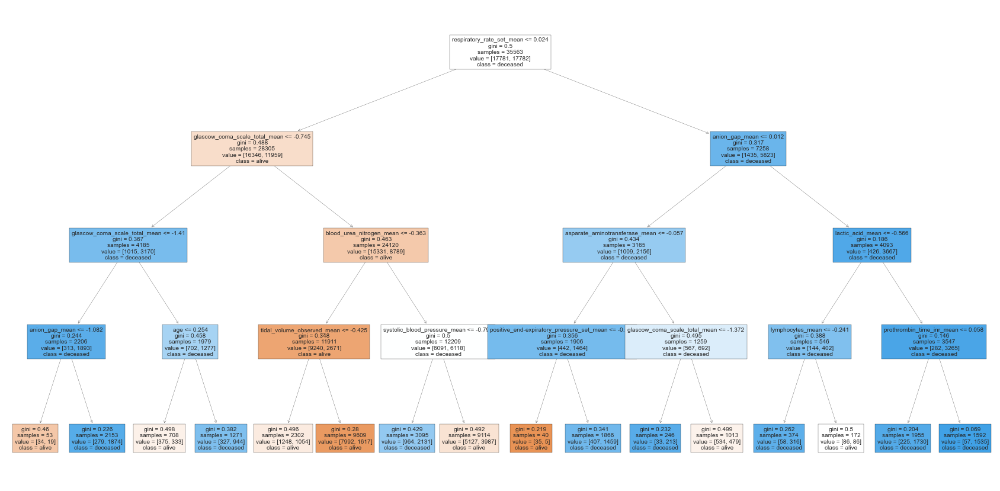

In [50]:
fig = plt.figure(figsize=(30,15)) 
fig = plot_tree(dt, fontsize=10, feature_names = list(X_train), class_names=['alive', 'deceased'], filled=True)
plt.show()

### PyALE

Investigate the model’s behavior on the 4 most important features using an accumulated local effects (ALE) plot.

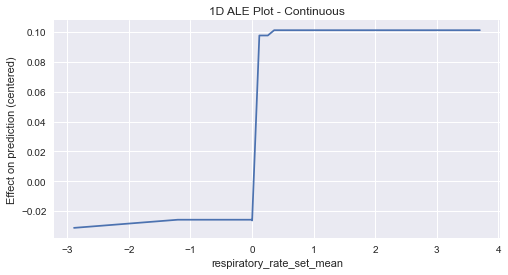

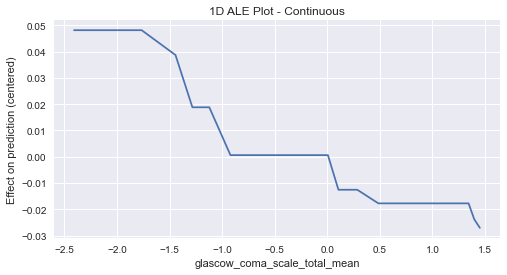

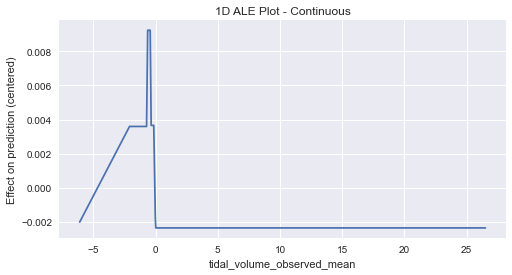

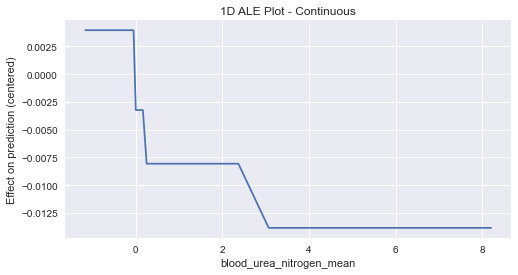

In [51]:
## 1D - continuous - no CI
for f in sel_features:
    ale_eff = ale(
        X=X_test, model=model, feature=[f], grid_size=50, include_CI=False, feature_type="continuous"
    )

### LIME

Randomly select 3 instances and explore them in more detail using local explanations.

In [52]:
# sample three instances
sample_X = X_test.sample(n=3, random_state=45)
sample_y = y[sample_X.index]

# display instance, true class, and model confidence
display(sample_X)
print("XGBoost:")
print("True values")
print(list(sample_y))
print("Predictions")
print([i[1] for i in model.predict_proba(sample_X)])
sample_y

,gender,age,age_group,ethnicity_BLACK,ethnicity_WHITE,ethnicity_OTHER,alanine_aminotransferase_mean,alkaline_phosphate_mean,anion_gap_mean,asparate_aminotransferase_mean,...,respiratory_rate_set_mean,sodium_mean,systolic_blood_pressure_mean,temperature_mean,tidal_volume_observed_mean,tidal_volume_set_mean,weight_mean,white_blood_cell_count_mean,ph_mean,ph_urine_mean
subject_id,,,,,,,,,,,,,,,,,,,,,
15151,0.916137,-0.531337,-1.140317,-0.265938,0.672196,-0.569915,7.610076,-0.480016,0.497805,5.140696,...,0.002951,-0.530781,-0.397645,-0.462504,0.011383,-0.009146,3.387646,0.105237,0.012394,-1.163462
23262,0.916137,0.341323,0.876949,-0.265938,0.672196,-0.569915,-0.331521,-0.823481,1.031194,-0.322926,...,0.761771,0.423478,-0.497023,0.087349,0.479586,0.176373,0.042918,-0.014319,-1.313725,-1.163462
37090,0.916137,0.457677,0.876949,-0.265938,0.672196,-0.569915,-0.341810,-0.447916,0.054469,-0.347226,...,-0.902813,-0.218275,0.757477,0.144117,2.657515,2.492750,0.042918,-0.400806,0.663074,-0.002437


XGBoost:
True values
[0, 1, 1]
Predictions
[0.02791527, 0.9776102, 0.81992173]


subject_id
15151    0
23262    1
37090    1
Name: mort_icu, dtype: int64

The first instance is a person who is alive and the other two instances are people who died. The XGB classifier predicts the all instances with high confidence.

The LIME explainer uses the same configuration as the one used for the DT classifier.

In [53]:
# local explainers
# define lime explainer
lime_explainer = LimeTabularExplainer(np.array(X_train), mode='classification', feature_names=list(X_train), 
                                     kernel_width = np.sqrt(len(X_train)), discretize_continuous=False, 
                                     feature_selection='forward_selection')

# explain the three instances
for i in range(3):
    explanation_i = lime_explainer.explain_instance(sample_X.iloc[i], model.predict_proba, num_features=10, 
                                                    num_samples=5000, distance_metric="euclidean", )
    print("Local prediction: %.2f" % explanation_i.local_pred)
    print("Fit (Rˆ2): %.2f" % explanation_i.score)
    print("Intercept: %.2f" % explanation_i.intercept[1])
    explanation_i.show_in_notebook()
    
    plt.show()

Local prediction: 0.08
Fit (Rˆ2): 0.29
Intercept: 0.13


Local prediction: 0.24
Fit (Rˆ2): 0.30
Intercept: 0.13


Local prediction: 0.02
Fit (Rˆ2): 0.29
Intercept: 0.13


### SHAP

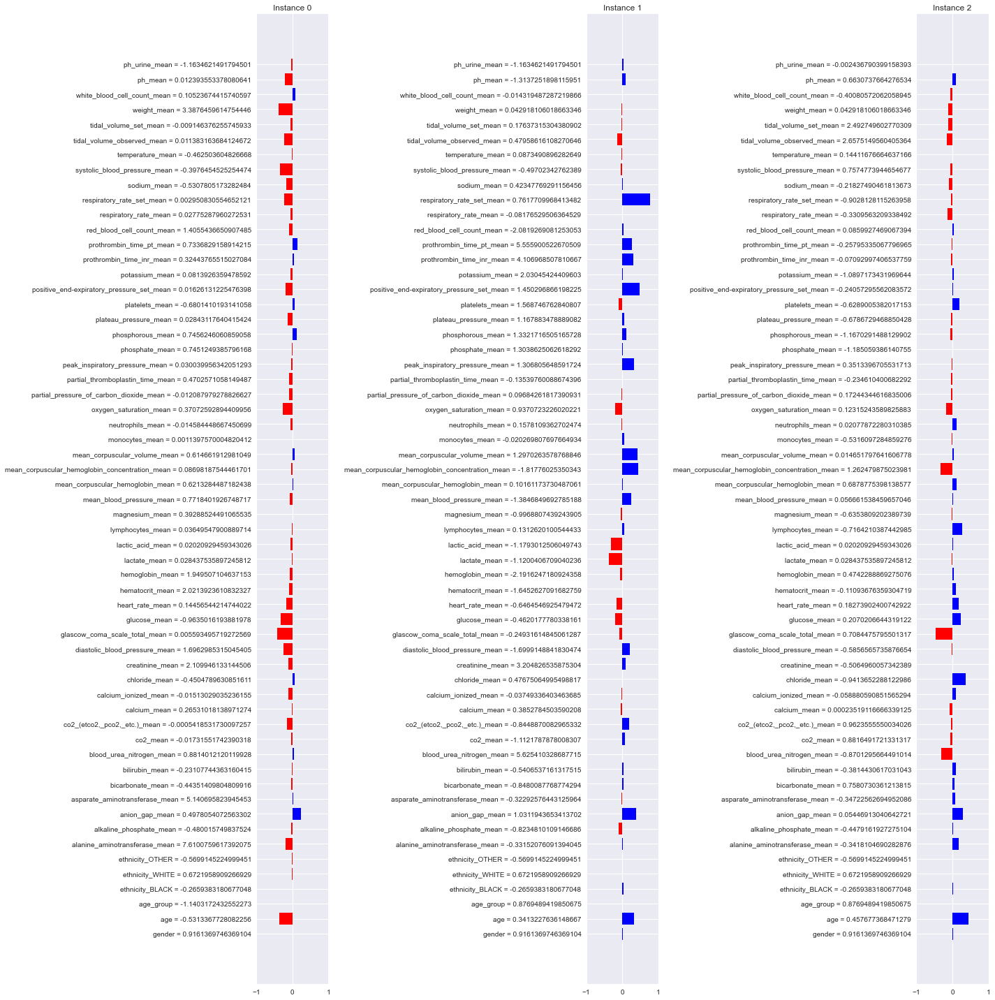

In [54]:
explainer = Explainer(model, X_train)
shap_values = explainer(sample_X)

# plot shap values
feature_names = list(X_train)
fig, ax = fig, ax = plt.subplots(1,3, figsize=(20,20))
for i in range(3):
    # get values for instance
    feature_values_i = shap_values.data[i]
    shap_values_i = [i for i in shap_values[i].values]
    feature_labels_i = ['%s = %s' % (name, value) for name, value in zip(feature_names, feature_values_i)]
    # plot instance
    ax[i].barh(feature_labels_i, shap_values_i, color=['b' if i>= 0 else 'r' for i in np.sign(shap_values_i)])
    ax[i].set_title("Instance %s" % i)
    ax[i].set_xlim(-1.0,1.0)
plt.tight_layout()
plt.savefig('SHAP', dpi=256)
plt.show()

## Comparison

The two models are quite similar in terms of explainability. This is the case for the fidelity of the two models. They showed very similar true positive and true negative rates. Furthermore, the models share 3 most important features (glascow coma scale total mean, tidal volume observed mean, respiratory rate set mean). The ALE plots show how the shared features behaved in the two models. The "respiratory rate set mean" plot has a very similar distribution of its effect on the prediction, with the only difference occurring when the value is between -1 and 0. Whether the value of the vital is positive or negative seems to be the only indicator about the effect on the prediction in XGB, whereas the effect in the Decision Tree experiences different values in the specified range of values. A bigger difference in the effect can be seen in the "glascow coma scale total mean" feature. In XGB the effect value declines when the feature value gets bigger and in the Decision Tree the it seems to be having the exact opposite reaction when the feature value gets bigger until some point (0.5). When using LIME as a local explainer all the values were way too low in order to say anything of significance. Although XGB had significantly higher R2 values than the Decision tree (0.3 vs 0.06), the observed values are way too low which means that both models do not fit that well. The local prediction and the intercept values were quite low for both models as well. SHAP shows the local explanation for the two models on 3 instances. It can be seen how they differ from each other and what features led to the final prediction. Some features had bigger weight in one model and some - in the other.

The XGBoost model seems to perform the best in terms of predictive performance, fairness, and explainability. In the case of the task false negatives have a higher cost than false positives as that is more dangerous for the patients. Thus, since the TPR is maximized when the false negatives are minimal, the model with a higher sensitivity than specificity will be preferred. From all the classifiers XGBoost had the highest sensitivity and specificity. Its sensitivity was also a bit better than the specificity. Additionally, its AUC score was the highest. 

Furthermore, the Equalized odds tests showed that the XGBoost model does not make more mistakes for some groups than for other groups as wanted. For fairness, XGBoost has the smallest equalized odds difference for the three sensitive features among the other models.

Global and local explanation techniques were used for explainability. There was no substantial difference between the XGBoost and DT models in terms of explainability.

## Evaluation of the XGBoost model in terms of fairness

The equalized odds difference for the sensitive features are very low, which means that there is no unfairness  between groups.  Additionally, the FPR and FNR are very low for all groups and all sensitive features.

## Evaluation of the XGBoost model in terms of explainability

The global surrogate decision tree model is not very good at predicting the XGBoost’s predictions based on the fidelity scores. The predictive performance is also found to be lacking. This is likely because the simple decision tree cannot capture the decision logic of the complex XGBoost classifier. 4 of the 5 most important features for both models are the same.

In the ALE plots for XGBoost, it can be seen that if "respiratory rate set mean" is above 0 it has a strong effect on predictive performance. This matches the finding in the surrogate model since this feature was a root node. For "glascow coma scale total mean" it can be seen that if it is smaller than −0,9 the average prediction increases, but if it is larger than 0 the average prediction decreases. It can be seen that for "tidal volume observed mean" the prediction rises, but falls again when it is very close to 0. Finally, the feature "blood urea nitrogen mean" has a negative effect because when it is in the range [0...3] the more it increases, the more the prediction effect decreases.

The statistics of the local lasso regression model for XGBoost were very poor. The local regression models for the three instances are very similar but do not fit well. Additionally, the local predictions do are not even close to the predictions of the XGBoost model, especially for the second and third instances. The differences in prediction probabilities are due to differences in feature values. Again, this can be because the local model cannot capture the decision logic of the complex XGBoost classifier. For the three instances, the value for "glascow coma scale total mean" contributed negatively, but the combination of the other features contributed positively more strongly. Generally, it was difficult to make conclusions about using this method.

In terms of SHAP values for the first instance, "glascow coma scale total mean" = 0.006,  "glucose mean" = −0.96, "respiratory rate set mean" = 0.003, "systolic blood pressure mean" = −0.397 and other feature values contributed to the prediction that the person is alive. For the second instance "respiratory rate set mean" = 0.76, "anion gap mean" = 1.03 and other feature values contributed to the prediction that the person is deceased. For the third instance "anion gap mean" = 1.03, "chloride mean" = −0.94, "lymphocite mean" = −0.71, and other feature values contributed to the prediction that the person is deceased, despite "glascow coma scale total mean" = 0.708, "blood urea nitrogen mean" = −0.870 and other feature values pushing the prediction to the alive class.